In [87]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [88]:
df=pd.read_csv("https://raw.githubusercontent.com/iNeuronai/EDACollection/master/FitBit/FitBit%20data.csv")

In [89]:
df

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
0,1503960366,3/25/2016,11004,7.110000,7.110000,0.0,2.57,0.46,4.07,0.00,33,12,205,804,1819
1,1503960366,3/26/2016,17609,11.550000,11.550000,0.0,6.92,0.73,3.91,0.00,89,17,274,588,2154
2,1503960366,3/27/2016,12736,8.530000,8.530000,0.0,4.66,0.16,3.71,0.00,56,5,268,605,1944
3,1503960366,3/28/2016,13231,8.930000,8.930000,0.0,3.19,0.79,4.95,0.00,39,20,224,1080,1932
4,1503960366,3/29/2016,12041,7.850000,7.850000,0.0,2.16,1.09,4.61,0.00,28,28,243,763,1886
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,8877689391,4/8/2016,23014,20.389999,20.389999,0.0,11.10,0.63,8.62,0.00,70,29,359,982,4196
453,8877689391,4/9/2016,16470,8.070000,8.070000,0.0,0.00,0.02,8.02,0.00,90,9,289,1052,3841
454,8877689391,4/10/2016,28497,27.530001,27.530001,0.0,21.92,1.12,4.46,0.00,128,46,211,1055,4526
455,8877689391,4/11/2016,10622,8.060000,8.060000,0.0,1.47,0.15,6.37,0.01,18,7,225,1190,2820


In [90]:
df.shape

(457, 15)

In [91]:
df.isnull().sum()

Id                          0
ActivityDate                0
TotalSteps                  0
TotalDistance               0
TrackerDistance             0
LoggedActivitiesDistance    0
VeryActiveDistance          0
ModeratelyActiveDistance    0
LightActiveDistance         0
SedentaryActiveDistance     0
VeryActiveMinutes           0
FairlyActiveMinutes         0
LightlyActiveMinutes        0
SedentaryMinutes            0
Calories                    0
dtype: int64

In [92]:
df2=df.copy()

In [93]:
df2.columns

Index(['Id', 'ActivityDate', 'TotalSteps', 'TotalDistance', 'TrackerDistance',
       'LoggedActivitiesDistance', 'VeryActiveDistance',
       'ModeratelyActiveDistance', 'LightActiveDistance',
       'SedentaryActiveDistance', 'VeryActiveMinutes', 'FairlyActiveMinutes',
       'LightlyActiveMinutes', 'SedentaryMinutes', 'Calories'],
      dtype='object')

In [94]:
df2['ActivityDate'].unique()

array(['3/25/2016', '3/26/2016', '3/27/2016', '3/28/2016', '3/29/2016',
       '3/30/2016', '3/31/2016', '4/1/2016', '4/2/2016', '4/3/2016',
       '4/4/2016', '4/5/2016', '4/6/2016', '4/7/2016', '4/8/2016',
       '4/9/2016', '4/10/2016', '4/11/2016', '4/12/2016', '3/12/2016',
       '3/13/2016', '3/14/2016', '3/15/2016', '3/16/2016', '3/17/2016',
       '3/18/2016', '3/19/2016', '3/20/2016', '3/21/2016', '3/22/2016',
       '3/23/2016', '3/24/2016'], dtype=object)

In [95]:
type(df2['ActivityDate'])

pandas.core.series.Series

In [96]:
df2['ActivityDate'].head()

0    3/25/2016
1    3/26/2016
2    3/27/2016
3    3/28/2016
4    3/29/2016
Name: ActivityDate, dtype: object

In [97]:
# adding the yearm month and date columns to the dataset
df2['day']=pd.DatetimeIndex(df2['ActivityDate']).day
df2['year']=pd.DatetimeIndex(df2['ActivityDate']).year
df2['month']=pd.DatetimeIndex(df2['ActivityDate']).month
df2['week']=pd.DatetimeIndex(df2['ActivityDate']).weekofyear
df2['day2']=pd.DatetimeIndex(df2['ActivityDate']).day_name()

C:\Users\VEENAB~1.S\AppData\Local\Temp/ipykernel_17960/135562610.py:5: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  df2['week']=pd.DatetimeIndex(df2['ActivityDate']).weekofyear


In [98]:
df2.head()

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,day,year,month,week,day2
0,1503960366,3/25/2016,11004,7.11,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819,25,2016,3,12,Friday
1,1503960366,3/26/2016,17609,11.55,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154,26,2016,3,12,Saturday
2,1503960366,3/27/2016,12736,8.53,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944,27,2016,3,12,Sunday
3,1503960366,3/28/2016,13231,8.93,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932,28,2016,3,13,Monday
4,1503960366,3/29/2016,12041,7.85,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886,29,2016,3,13,Tuesday


In [99]:
df2=df2.drop(['TrackerDistance'],axis=1)

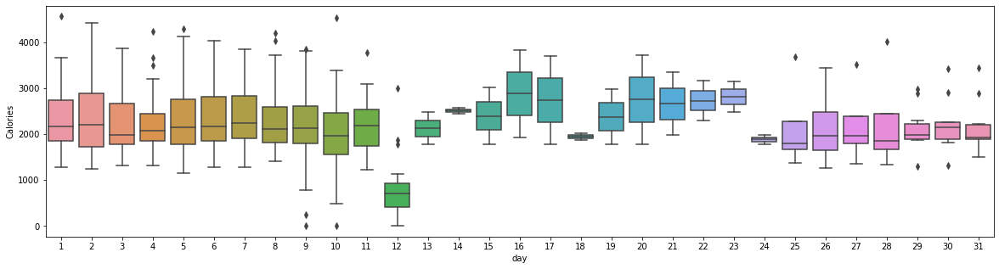

In [100]:
### Groupby the day of the month and make a boxplot of calories burnt
plt.figure(figsize=(20,5))
ax=sns.boxplot(x='day',y='Calories',data=df2)

Text(0.5, 1.0, 'Box plot of Calories with Jitter bu day of the month')

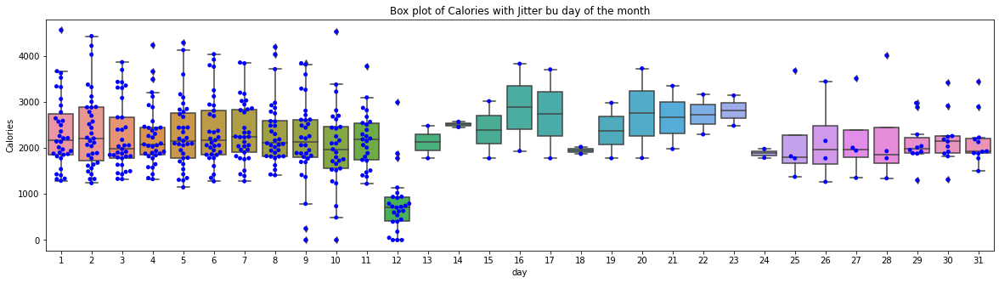

In [101]:
plt.figure(figsize=(20,5))
# Usual boxplot
ax = sns.boxplot(x='day', y='Calories', data=df2)
 
# Add jitter with the swarmplot function.
ax = sns.swarmplot(x='day', y='Calories', data=df2, color="blue")

ax.set_title('Box plot of Calories with Jitter bu day of the month')

In [102]:
df2.columns

Index(['Id', 'ActivityDate', 'TotalSteps', 'TotalDistance',
       'LoggedActivitiesDistance', 'VeryActiveDistance',
       'ModeratelyActiveDistance', 'LightActiveDistance',
       'SedentaryActiveDistance', 'VeryActiveMinutes', 'FairlyActiveMinutes',
       'LightlyActiveMinutes', 'SedentaryMinutes', 'Calories', 'day', 'year',
       'month', 'week', 'day2'],
      dtype='object')

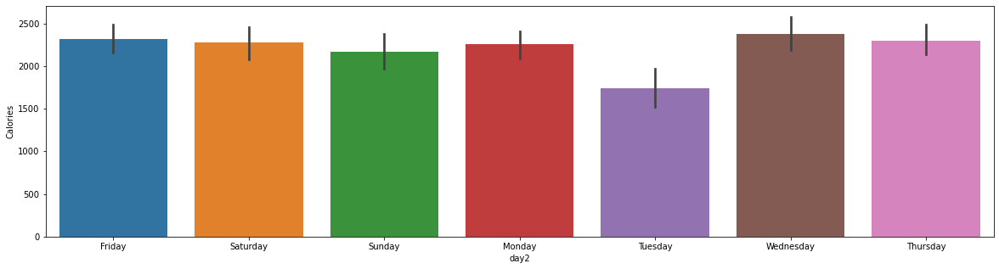

In [103]:
plt.figure(figsize=(20,5))
ax=sns.barplot(x='day2',y='Calories',data=df2)

<AxesSubplot:xlabel='Calories', ylabel='SedentaryMinutes'>

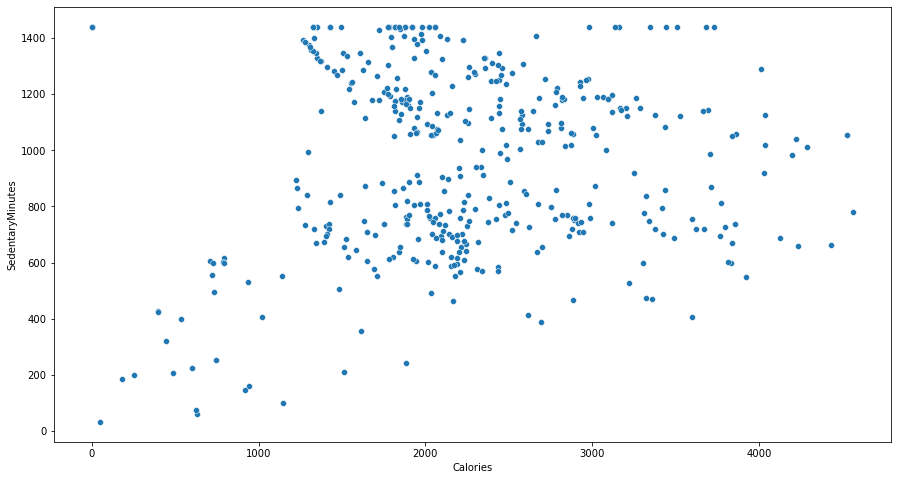

In [104]:
plt.figure(figsize=(15,8))
sns.scatterplot(x='Calories',y='SedentaryMinutes',data=df2)

<AxesSubplot:xlabel='Calories', ylabel='LightlyActiveMinutes'>

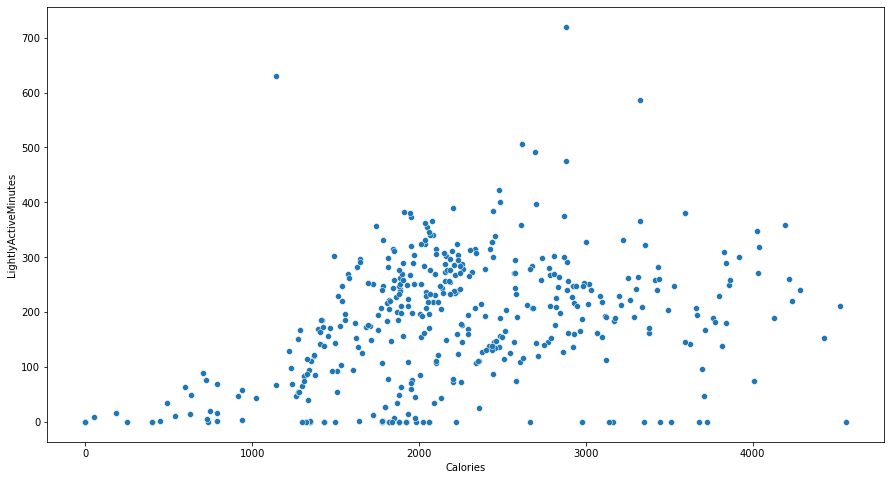

In [105]:
plt.figure(figsize=(15,8))
sns.scatterplot(x='Calories',y='LightlyActiveMinutes',data=df2)

<AxesSubplot:xlabel='Calories', ylabel='TotalDistance'>

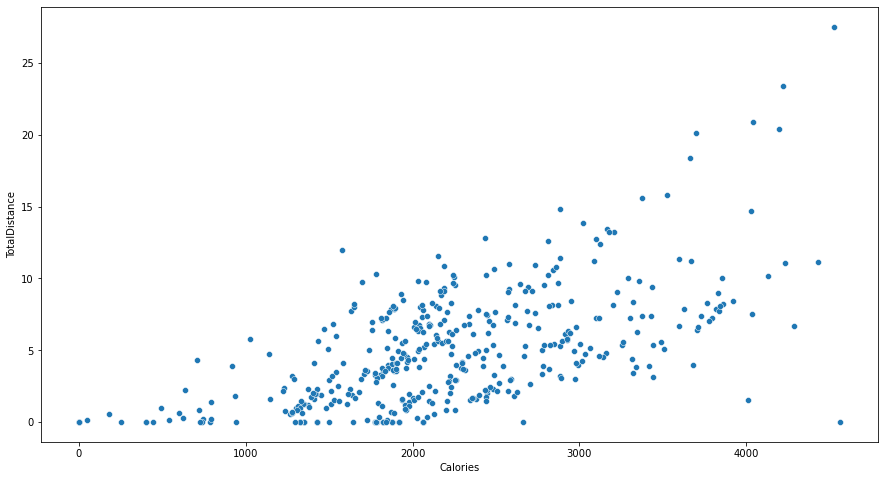

In [106]:
plt.figure(figsize=(15,8))
sns.scatterplot(x='Calories',y='TotalDistance',data=df2)

In [107]:
import pandas_profiling  

In [109]:
pf=df2.profile_report()
pf

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [110]:
pf.widgets()

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

TypeError: 'VBox' object is not callable